In [1]:
import matplotlib.pyplot as plt
import numpy as np
import os
import cv2
import tensorflow as tf
from tensorflow.keras import layers
from tensorflow.keras.applications import MobileNetV2
# from twilio.rest import Client
from PIL import Image
from geopy.geocoders import Nominatim

In [2]:
IMG_SIZE=(224,224,3)
img_size = (224, 224)
batch_size = 32

In [3]:
# Use image_dataset_from_directory to load the dataset
train_dataset = tf.keras.preprocessing.image_dataset_from_directory(
    '/kaggle/input/accident-detection-from-cctv-footage/data/train',
    labels='inferred',
    label_mode='binary',
    image_size=img_size,
    batch_size=batch_size,
    validation_split=0.2,
    subset='training',
    seed=43
)

test_dataset = tf.keras.preprocessing.image_dataset_from_directory(
    '/kaggle/input/accident-detection-from-cctv-footage/data/test',
    labels='inferred',
    label_mode='binary',
    image_size=img_size,
    batch_size=batch_size,
    validation_split=0.2,
    subset='training',
    seed=43
)

validation_dataset = tf.keras.preprocessing.image_dataset_from_directory(
    '/kaggle/input/accident-detection-from-cctv-footage/data/val',
    labels='inferred',
    label_mode='binary',
    image_size=img_size,
    batch_size=batch_size,
    validation_split=0.2,
    subset='validation',
    seed=43
)

Found 791 files belonging to 2 classes.
Using 633 files for training.
Found 100 files belonging to 2 classes.
Using 80 files for training.
Found 98 files belonging to 2 classes.
Using 19 files for validation.


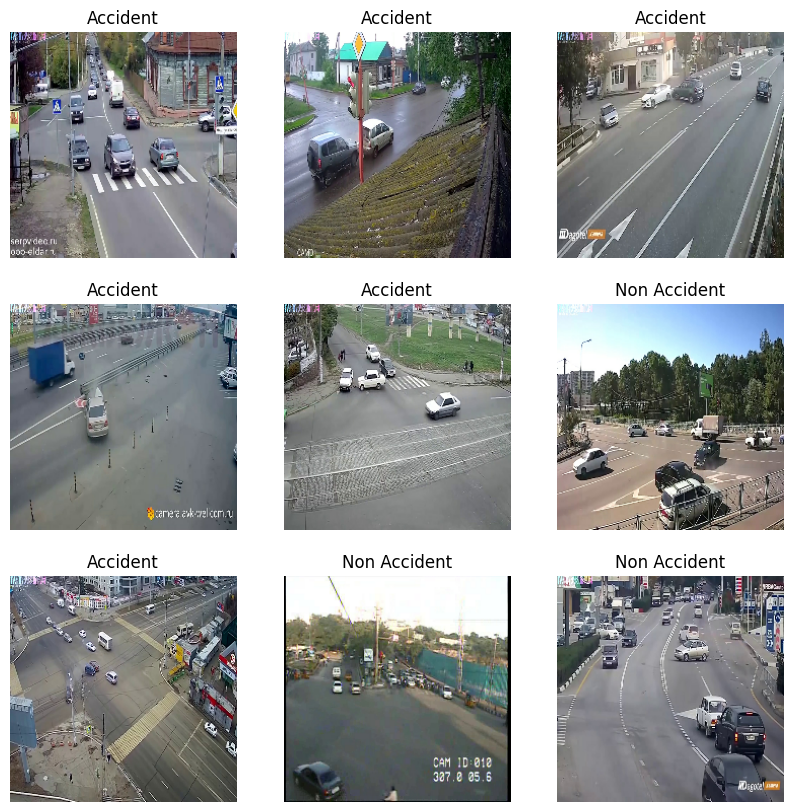

In [4]:
plt.figure(figsize=(10, 10))
class_names = train_dataset.class_names

for images, labels in train_dataset.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title(class_names[int(labels[i])])  # Use int() to convert the TensorFlow tensor to a Python integer
        plt.axis("off")

In [5]:
AUTOTUNE = tf.data.AUTOTUNE

train_dataset = train_dataset.prefetch(buffer_size=AUTOTUNE)
validation_dataset = validation_dataset.prefetch(buffer_size=AUTOTUNE)
test_dataset = test_dataset.prefetch(buffer_size=AUTOTUNE)


In [6]:
# augmenting data
data_augmentation = tf.keras.Sequential([
  layers.RandomFlip("horizontal_and_vertical"),
  layers.RandomRotation(0.2),
  layers.RandomZoom(
		height_factor=(-0.05, -0.15),
		width_factor=(-0.05, -0.15)),
  layers.RandomRotation(0.3)
])

In [7]:
callback = tf.keras.callbacks.EarlyStopping(
    monitor='val_accuracy',
    min_delta = 0.01,
    patience=15,
    verbose=0,
    mode='auto',
    baseline=None,
    restore_best_weights=True,
    start_from_epoch=0
)

In [8]:
base_model_MobileNetV2 = tf.keras.applications.MobileNetV2(input_shape=IMG_SIZE,include_top=False,weights='imagenet')
base_model_MobileNetV2.trainable = False

#Add final few layers that are specific to our function and task to enhance ability in those categories
model = tf.keras.Sequential([
    layers.Rescaling(1./255),  # Rescaling 
    data_augmentation,
    base_model_MobileNetV2,
    layers.Conv2D(16, 3, activation='relu'),
    layers.BatchNormalization(),
    layers.Conv2D(64, 3, activation='relu'),
    layers.BatchNormalization(),
    layers.Conv2D(128, 3, activation='sigmoid'),
    layers.Flatten(),
    layers.Dense(len(class_names), activation= 'softmax')
])

model.compile(optimizer='adam',loss='sparse_categorical_crossentropy', metrics=['accuracy'])

9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


In [9]:
model_history = model.fit(train_dataset, validation_data = validation_dataset, epochs = 100,callbacks=[callback])

Epoch 1/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 16s 233ms/step - accuracy: 0.4852 - loss: 0.7870 - val_accuracy: 0.6842 - val_loss: 0.6588
Epoch 2/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 2s 82ms/step - accuracy: 0.6670 - loss: 0.6125 - val_accuracy: 0.8421 - val_loss: 0.4926
Epoch 3/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 2s 79ms/step - accuracy: 0.6724 - loss: 0.5813 - val_accuracy: 0.7895 - val_loss: 0.5272
Epoch 4/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 2s 78ms/step - accuracy: 0.7169 - loss: 0.5472 - val_accuracy: 0.7368 - val_loss: 0.6851
Epoch 5/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 2s 80ms/step - accuracy: 0.7470 - loss: 0.5029 - val_accuracy: 0.7895 - val_loss: 0.4957
Epoch 6/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - accuracy: 0.7698 - loss: 0.4479 - val_accuracy: 0.7368 - val_loss: 0.5128
Epoch 7/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 2s 78ms/step - accuracy: 0.7818 - loss: 0.4449 - val_accuracy: 0.7895 - val_loss: 0.5608
Epoch 8/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 2s 79ms/step - accuracy: 0.7635 - loss: 0.4306 - val_accuracy: 

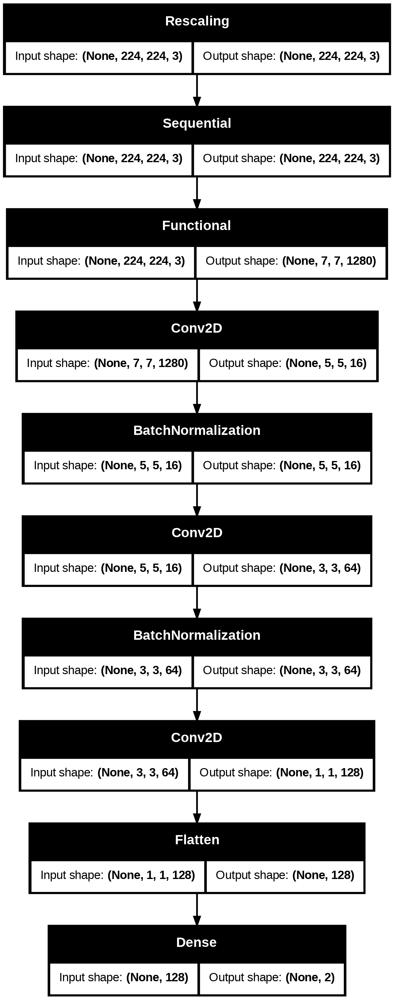

In [10]:
tf.keras.utils.plot_model(model, show_shapes=True)

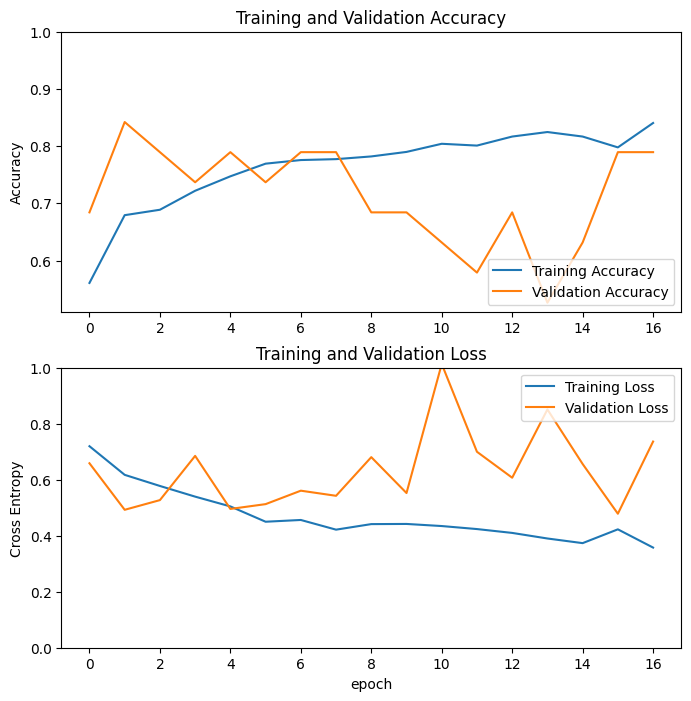

In [11]:
acc = model_history.history['accuracy']
val_acc = model_history.history['val_accuracy']

loss = model_history.history['loss']
val_loss = model_history.history['val_loss']

plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()


In [12]:
loss, accuracy = model.evaluate(test_dataset)
print('Test accuracy :', accuracy)

3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 338ms/step - accuracy: 0.5766 - loss: 0.8133
Test accuracy : 0.574999988079071


In [13]:
print(class_names)

['Accident', 'Non Accident']


In [14]:
def predict_frame(img):
    img_array = tf.keras.utils.img_to_array(img)
    img_batch = np.expand_dims(img_array, axis=0)
    prediction=(model.predict(img_batch) > 0.5).astype("int32")
    if(prediction[0][0]==0):
        return("Accident Detected")
    else:
        return("No Accident")

In [15]:
image=[]
label=[]

c=1
cap= cv2.VideoCapture('/kaggle/input/cctvfootagevideo/videoplayback (online-video-cutter.com).mp4')
while True:
    _, frame = cap.read()

    # Break the loop if no more frames are available
    if frame is None:break

    if (c % 20 == 0):  # Capture every other frame to achieve approximately 60 fps
        resized_frame = tf.keras.preprocessing.image.smart_resize(frame, img_size, interpolation='bilinear')
        image.append(frame)
        label.append(predict_frame(resized_frame))
    
    c += 1
cap.release()

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━

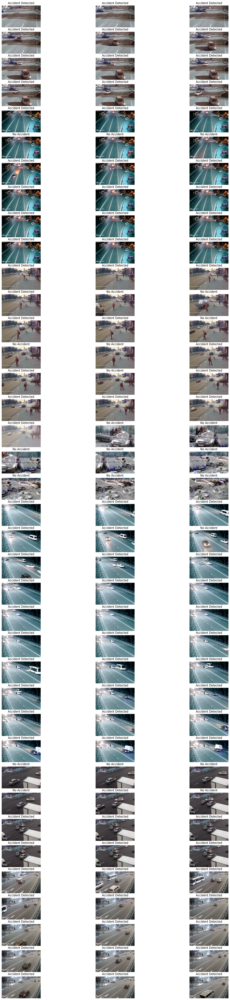

In [16]:
plt.figure(figsize=(20, 75))

for i in range(114):
    ax = plt.subplot(38, 3, i + 1)  # 38 rows, 3 columns
    plt.imshow(image[i])
    plt.title(label[i])
    plt.axis("off")

plt.show()

In [17]:
# Convert the model
converter = tf.lite.TFLiteConverter.from_keras_model(model) # path to the SavedModel directory
tflite_model = converter.convert()

# Save the model.
with open('model.tflite', 'wb') as f:
  f.write(tflite_model)

Saved artifact at '/tmp/tmpa1bmkmu3'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name='keras_tensor_154')
Output Type:
  TensorSpec(shape=(None, 2), dtype=tf.float32, name=None)
Captures:
  136704793002752: TensorSpec(shape=(), dtype=tf.resource, name=None)
  136704248727856: TensorSpec(shape=(), dtype=tf.resource, name=None)
  136704248725744: TensorSpec(shape=(), dtype=tf.resource, name=None)
  136704248544448: TensorSpec(shape=(), dtype=tf.resource, name=None)
  136704248726976: TensorSpec(shape=(), dtype=tf.resource, name=None)
  136704248734016: TensorSpec(shape=(), dtype=tf.resource, name=None)
  136704248734368: TensorSpec(shape=(), dtype=tf.resource, name=None)
  136704248735424: TensorSpec(shape=(), dtype=tf.resource, name=None)
  136704248726096: TensorSpec(shape=(), dtype=tf.resource, name=None)
  136704248734192: TensorSpec(shape=(), dtype=tf.resource, name=None)
  1367042487

Prediction results: [[0.7411572 0.2588429]]


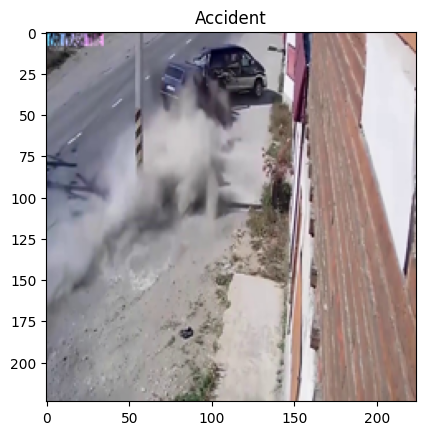

In [26]:
# Load the TFLite model
interpreter = tf.lite.Interpreter(model_path='model.tflite')
interpreter.allocate_tensors()

# Get input and output details
input_details = interpreter.get_input_details()
output_details = interpreter.get_output_details()

# Preprocess the image
img = Image.open("/kaggle/input/accident-detection-from-cctv-footage/data/test/Accident/test12_16.jpg").resize((224, 224))  # Resize to (224, 224)
img_array = tf.keras.utils.img_to_array(img)
img_batch = np.expand_dims(img_array, axis=0)

# Set the input tensor
interpreter.set_tensor(input_details[0]['index'], img_batch)

# Invoke the interpreter
interpreter.invoke()

# Get the predictions
tflite_model_predictions = interpreter.get_tensor(output_details[0]['index'])

# Print the predictions
print("Prediction results:", tflite_model_predictions)

# Display the image using matplotlib
plt.imshow(img)
if(np.argmax(tflite_model_predictions)==1):plt.title("Non Accident")
else:plt.title("Accident")
plt.show()

Prediction results: [[0.28468156 0.71531844]]


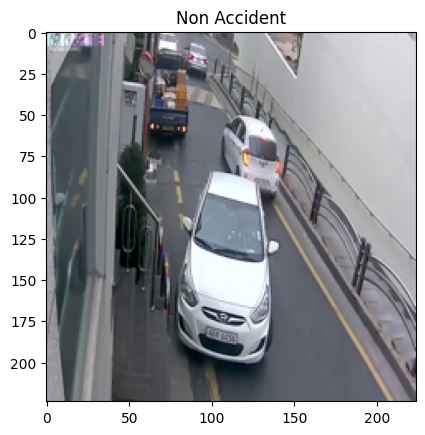

In [25]:
# Preprocess the image
img = Image.open("/kaggle/input/accident-detection-from-cctv-footage/data/test/Non Accident/test10_5.jpg").resize((224, 224))  # Resize to (224, 224)
img_array = tf.keras.utils.img_to_array(img)
img_batch = np.expand_dims(img_array, axis=0)

# Set the input tensor
interpreter.set_tensor(input_details[0]['index'], img_batch)

# Invoke the interpreter
interpreter.invoke()

# Get the predictions
tflite_model_predictions = interpreter.get_tensor(output_details[0]['index'])

# Print the predictions
print("Prediction results:", tflite_model_predictions)

# Display the image using matplotlib
plt.imshow(img)
if(np.argmax(tflite_model_predictions)==1):plt.title("Non Accident")
else:plt.title("Accident")
plt.show()

1